In [3]:
import sys
sys.path.append('../../')

In [4]:
from obelix_ml_pipeline.predictions_within_substrate_class import *
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor

%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [16]:
# try classifier with loaded representations
selected_ligand_representations = ['dft_nbd_model']
target = 'Conversion'
target_threshold = 0.8
rf_model = RandomForestClassifier(random_state=42)
scoring = 'balanced_accuracy'
train_splits = 5
n_jobs = 4
binary = True
plot_dendrograms = False
substrate_names_column = 'Substrate'
ligand_numbers_column = 'Ligand#'
selected_substrate = 'SM1'
training_size = 0.8  # 80% of data for subset substrate is used for training
print_ml_results = True
print('Training and testing classifier')
print(f'Test size in training (based on K-fold): {1 / train_splits}')
res = predict_within_substrate_class(selected_ligand_representations,
                                ligand_numbers_column, substrate_names_column, target, target_threshold, train_splits, binary,
                                selected_substrate, training_size, rf_model, scoring, print_ml_results, n_jobs)

In [21]:
res.fig_fi

Training and testing regression
Test size: 0.2
Mean test performance: 0.05 +/- 0.08
Best model performance: 0.83
Best model parameters: {'bootstrap': False, 'max_depth': 50, 'max_features': 3, 'min_samples_leaf': 2, 'min_samples_split': 10, 'n_estimators': 50}
Test set performance r2:  0.3439444194941135


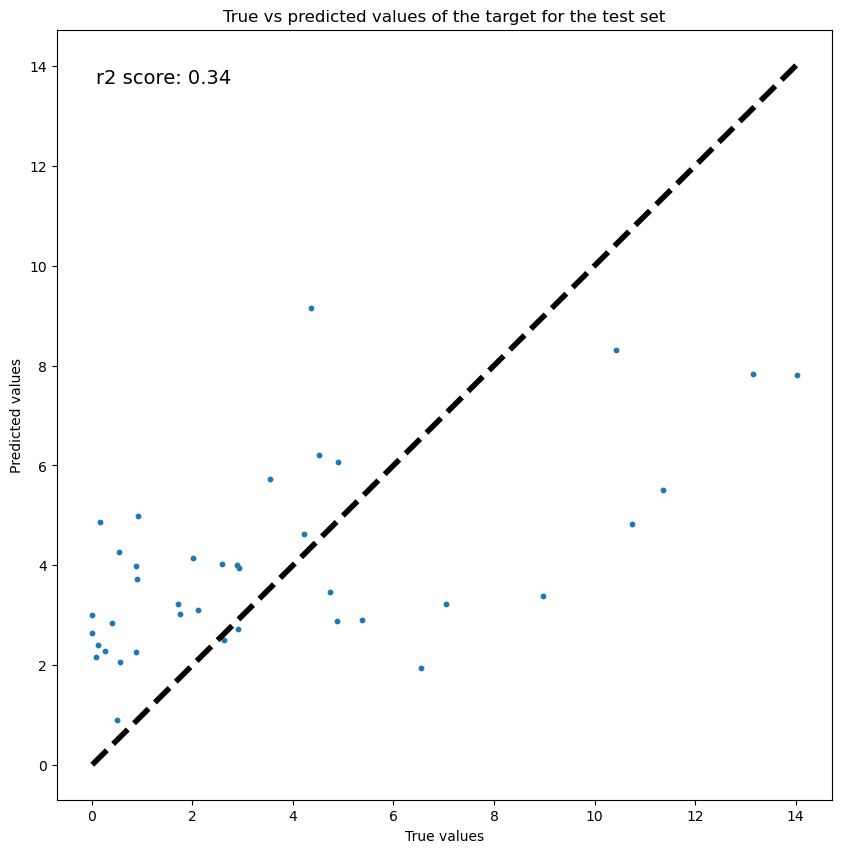

In [24]:
# try regression with loaded representations
target = 'DDG'
target_threshold = 0.6
rf_model = RandomForestRegressor(random_state=42)
scoring = 'r2'
binary = False
print('Training and testing regression')
print(f'Test size: {1 / train_splits}')
res = predict_within_substrate_class(selected_ligand_representations,
                                ligand_numbers_column, substrate_names_column, target, target_threshold, train_splits, binary,
                                selected_substrate, training_size, rf_model, scoring, print_ml_results, n_jobs)
res.testing_confusion_fig.show()

In [25]:
res.fig_fi

## Test effect of subset size on performance for various substrates/ligands

In [5]:
%%capture captured

import pandas as pd
import numpy as np
from obelix_ml_pipeline.representation_variables import AVAILABLE_LIGAND_REPRESENTATION_TYPES, AVAILABLE_SUBSTRATE_REPRESENTATION_TYPES
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.manifold import SpectralEmbedding

target = 'Conversion'
target_threshold = 0.8
scoring = 'balanced_accuracy'
train_splits = 5
n_jobs = 4
binary = True
plot_dendrograms = False
substrate_names_column = 'Substrate'
ligand_numbers_column = 'Ligand#'

training_size = 0.75

print_ml_results = True

# loop over all substrate/ligand representations
# collect mean and std of test performance during training per representation for plotting
list_of_test_scores_mean = []
list_of_test_scores_std = []
test_performance = []
res_df = pd.DataFrame(np.zeros((len(AVAILABLE_LIGAND_REPRESENTATION_TYPES)*2,len(['SM1','SM2','SM3','SM7','SM8']))), 
                 index = AVAILABLE_LIGAND_REPRESENTATION_TYPES+[i+'_pca' for i in AVAILABLE_LIGAND_REPRESENTATION_TYPES],
                columns = ['SM1','SM2','SM3','SM7','SM8'])

for selected_substrate in ['SM1','SM2','SM3','SM7','SM8']:
    print('\n')
    print(selected_substrate)
    
    list_of_test_scores_mean_l = []
    list_of_test_scores_std_l = []
    test_performance_l = []
    
    for selected_ligand_representations in AVAILABLE_LIGAND_REPRESENTATION_TYPES:
        print(f'{selected_ligand_representations}')

        rf_model = RandomForestClassifier(random_state = 42)
        list_of_test_scores_mean_ls = []
        list_of_test_scores_std_ls = []
        test_performance_ls = []
        res = predict_within_substrate_class([selected_ligand_representations],
                            ligand_numbers_column, substrate_names_column, target, target_threshold, train_splits, binary,
                            selected_substrate, training_size, rf_model, scoring, print_ml_results, n_jobs, 
                            reduce_train_test_data_dimensionality=False, transformer=None)

        res_df.loc[selected_ligand_representations,selected_substrate]=res.testing_performance_test
        
        list_of_test_scores_mean_l.append(res.training_test_scores_mean)
        list_of_test_scores_std_l.append(res.training_test_scores_std)
        test_performance_l.append(res.testing_performance_test)
        
        res = predict_within_substrate_class([selected_ligand_representations],
                            ligand_numbers_column, substrate_names_column, target, target_threshold, train_splits, binary,
                            selected_substrate, training_size, rf_model, scoring, print_ml_results, n_jobs, 
                            reduce_train_test_data_dimensionality=True, transformer=PCA(n_components=0.95))

        res_df.loc[selected_ligand_representations+'_pca',selected_substrate]=res.testing_performance_test
        list_of_test_scores_mean_l.append(res.training_test_scores_mean)
        list_of_test_scores_std_l.append(res.training_test_scores_std)
        test_performance_l.append(res.testing_performance_test)
    
    
    list_of_test_scores_mean.append(list_of_test_scores_mean_l)
    list_of_test_scores_std.append(list_of_test_scores_std_l)
    test_performance.append(test_performance_l)
    
sns.heatmap(res_df, annot=True)

/projects/home/cvalsecc/condaenv/obelix/lib/python3.10/site-packages/sklearn/metrics/_classification.py:2184: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")
/projects/home/cvalsecc/condaenv/obelix/lib/python3.10/site-packages/sklearn/metrics/_classification.py:2184: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")
/projects/home/cvalsecc/condaenv/obelix/lib/python3.10/site-packages/sklearn/metrics/_classification.py:2184: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")
/projects/home/cvalsecc/condaenv/obelix/lib/python3.10/site-packages/sklearn/metrics/_classification.py:2184: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")
/projects/home/cvalsecc/condaenv/obelix/lib/python3.10/site-packages/sklearn/metrics/_classification.py:2184: UserWarning: y_pre

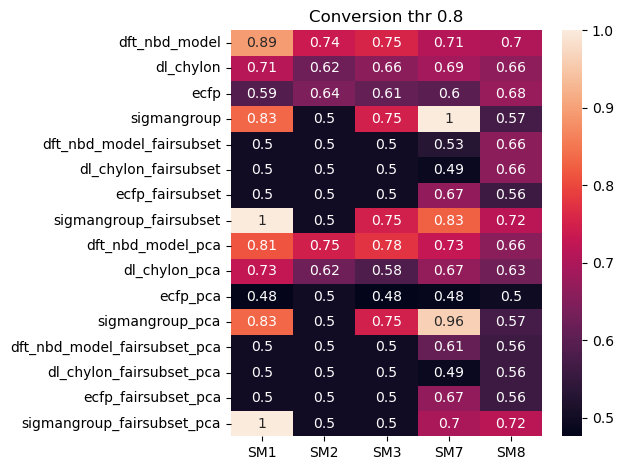

In [7]:
import matplotlib.pyplot as plt
ax = plt.axes()
fig = sns.heatmap(res_df, annot=True, ax = ax)
ax.set_title(f'{target} thr {target_threshold}')
filename = f'heatmap_within_substrate_{target}_threshold_{target_threshold}.png'
plt.tight_layout()
fig.figure.savefig(filename, dpi=300)

plt.show()

In [35]:
%%capture captured

import pandas as pd
import numpy as np
from obelix_ml_pipeline.representation_variables import AVAILABLE_LIGAND_REPRESENTATION_TYPES, AVAILABLE_SUBSTRATE_REPRESENTATION_TYPES
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.manifold import SpectralEmbedding


target = 'DDG'
target_threshold = 3.34
scoring = 'balanced_accuracy'
train_splits = 5
n_jobs = 4
binary = True
plot_dendrograms = False
substrate_names_column = 'Substrate'
ligand_numbers_column = 'Ligand#'

training_size = 0.75

print_ml_results = True

# loop over all substrate/ligand representations
# collect mean and std of test performance during training per representation for plotting
list_of_test_scores_mean = []
list_of_test_scores_std = []
test_performance = []
res_df = pd.DataFrame(np.zeros((len(AVAILABLE_LIGAND_REPRESENTATION_TYPES)*2,len(['SM1','SM2','SM3','SM7','SM8']))), 
                 index = AVAILABLE_LIGAND_REPRESENTATION_TYPES+[i+'_pca' for i in AVAILABLE_LIGAND_REPRESENTATION_TYPES],
                columns = ['SM1','SM2','SM3','SM7','SM8'])

#avg_ddg = [3.74953125, 4.97265625, 3.23463542, 1.48567708, 1.38098958]

for idx, selected_substrate in enumerate(['SM1','SM2','SM3','SM7','SM8']):
    print('\n')
    print(selected_substrate)
     
    list_of_test_scores_mean_l = []
    list_of_test_scores_std_l = []
    test_performance_l = []
    
    for selected_ligand_representations in AVAILABLE_LIGAND_REPRESENTATION_TYPES:
        print(f'{selected_ligand_representations}')

        rf_model = RandomForestClassifier(random_state = 42)
        list_of_test_scores_mean_ls = []
        list_of_test_scores_std_ls = []
        test_performance_ls = []
        res = predict_within_substrate_class([selected_ligand_representations],
                            ligand_numbers_column, substrate_names_column, target, target_threshold, train_splits, binary,
                            selected_substrate, training_size, rf_model, scoring, print_ml_results, n_jobs, 
                            reduce_train_test_data_dimensionality=False, transformer=None)

        res_df.loc[selected_ligand_representations,selected_substrate]=res.testing_performance_test
        
        list_of_test_scores_mean_l.append(res.training_test_scores_mean)
        list_of_test_scores_std_l.append(res.training_test_scores_std)
        test_performance_l.append(res.testing_performance_test)
        
        res = predict_within_substrate_class([selected_ligand_representations],
                            ligand_numbers_column, substrate_names_column, target, target_threshold, train_splits, binary,
                            selected_substrate, training_size, rf_model, scoring, print_ml_results, n_jobs, 
                            reduce_train_test_data_dimensionality=True, transformer=PCA(n_components=0.95))

        res_df.loc[selected_ligand_representations+'_pca',selected_substrate]=res.testing_performance_test
        list_of_test_scores_mean_l.append(res.training_test_scores_mean)
        list_of_test_scores_std_l.append(res.training_test_scores_std)
        test_performance_l.append(res.testing_performance_test)
    
    
    list_of_test_scores_mean.append(list_of_test_scores_mean_l)
    list_of_test_scores_std.append(list_of_test_scores_std_l)
    test_performance.append(test_performance_l)
    
sns.heatmap(res_df, annot=True)

/projects/home/cvalsecc/condaenv/obelix/lib/python3.10/site-packages/sklearn/metrics/_classification.py:2184: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")
/projects/home/cvalsecc/condaenv/obelix/lib/python3.10/site-packages/sklearn/metrics/_classification.py:2184: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")
/projects/home/cvalsecc/condaenv/obelix/lib/python3.10/site-packages/sklearn/metrics/_classification.py:2184: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")
/projects/home/cvalsecc/condaenv/obelix/lib/python3.10/site-packages/sklearn/metrics/_classification.py:2184: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")
/projects/home/cvalsecc/condaenv/obelix/lib/python3.10/site-packages/sklearn/metrics/_classification.py:2184: UserWarning: y_pre

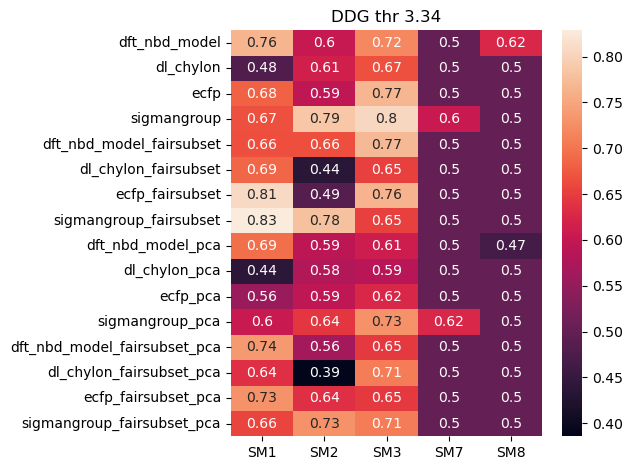

In [36]:
import matplotlib.pyplot as plt
ax = plt.axes()
fig = sns.heatmap(res_df, annot=True, ax = ax)
ax.set_title(f'{target} thr {target_threshold}')
filename = f'heatmap_within_substrate_{target}_threshold_{target_threshold}.png'
plt.tight_layout()
fig.figure.savefig(filename, dpi=300)

plt.show()

In [42]:
%%capture captured

import pandas as pd
import numpy as np
from obelix_ml_pipeline.representation_variables import AVAILABLE_LIGAND_REPRESENTATION_TYPES, AVAILABLE_SUBSTRATE_REPRESENTATION_TYPES
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.manifold import SpectralEmbedding


target = 'DDG'
#target_threshold = 3.34
scoring = 'balanced_accuracy'
train_splits = 5
n_jobs = 4
binary = True
plot_dendrograms = False
substrate_names_column = 'Substrate'
ligand_numbers_column = 'Ligand#'

training_size = 0.75

print_ml_results = True

# loop over all substrate/ligand representations
# collect mean and std of test performance during training per representation for plotting
list_of_test_scores_mean = []
list_of_test_scores_std = []
test_performance = []
res_df = pd.DataFrame(np.zeros((len(AVAILABLE_LIGAND_REPRESENTATION_TYPES)*2,len(['SM1','SM2','SM3','SM7','SM8']))), 
                 index = AVAILABLE_LIGAND_REPRESENTATION_TYPES+[i+'_pca' for i in AVAILABLE_LIGAND_REPRESENTATION_TYPES],
                columns = ['SM1','SM2','SM3','SM7','SM8'])

avg_ddg = [3.74953125, 4.97265625, 3.23463542, 1.48567708, 1.38098958]

for idx, selected_substrate in enumerate(['SM1','SM2','SM3','SM7','SM8']):
    print('\n')
    print(selected_substrate)
    target_threshold=avg_ddg[idx]
    list_of_test_scores_mean_l = []
    list_of_test_scores_std_l = []
    test_performance_l = []
    
    for selected_ligand_representations in AVAILABLE_LIGAND_REPRESENTATION_TYPES:
        print(f'{selected_ligand_representations}')

        rf_model = RandomForestClassifier(random_state = 42)
        list_of_test_scores_mean_ls = []
        list_of_test_scores_std_ls = []
        test_performance_ls = []
        res = predict_within_substrate_class([selected_ligand_representations],
                            ligand_numbers_column, substrate_names_column, target, target_threshold, train_splits, binary,
                            selected_substrate, training_size, rf_model, scoring, print_ml_results, n_jobs, 
                            reduce_train_test_data_dimensionality=False, transformer=None)

        res_df.loc[selected_ligand_representations,selected_substrate]=res.testing_performance_test
        
        list_of_test_scores_mean_l.append(res.training_test_scores_mean)
        list_of_test_scores_std_l.append(res.training_test_scores_std)
        test_performance_l.append(res.testing_performance_test)
        
        res = predict_within_substrate_class([selected_ligand_representations],
                            ligand_numbers_column, substrate_names_column, target, target_threshold, train_splits, binary,
                            selected_substrate, training_size, rf_model, scoring, print_ml_results, n_jobs, 
                            reduce_train_test_data_dimensionality=True, transformer=PCA(n_components=0.95))

        res_df.loc[selected_ligand_representations+'_pca',selected_substrate]=res.testing_performance_test
        list_of_test_scores_mean_l.append(res.training_test_scores_mean)
        list_of_test_scores_std_l.append(res.training_test_scores_std)
        test_performance_l.append(res.testing_performance_test)
    
    
    list_of_test_scores_mean.append(list_of_test_scores_mean_l)
    list_of_test_scores_std.append(list_of_test_scores_std_l)
    test_performance.append(test_performance_l)
    
sns.heatmap(res_df, annot=True)

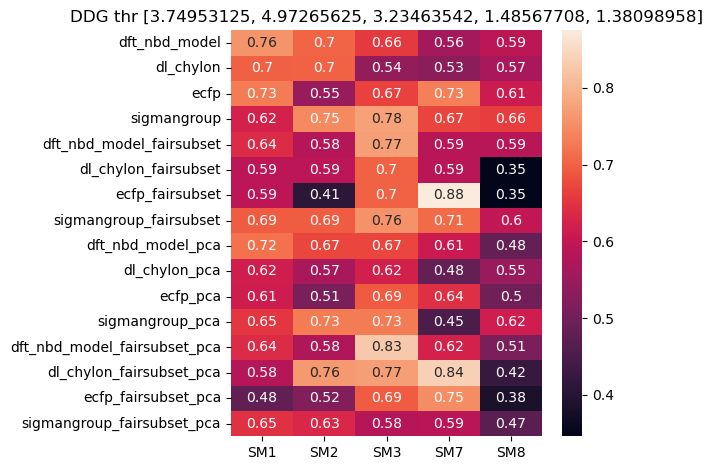

In [44]:
import matplotlib.pyplot as plt
ax = plt.axes()
fig = sns.heatmap(res_df, annot=True, ax = ax)
ax.set_title(f'{target} thr {avg_ddg}')
filename = f'heatmap_within_substrate_{target}_threshold_{avg_ddg}.png'
plt.tight_layout()
fig.figure.savefig(filename, dpi=300)

plt.show()



SM1
dft_nbd_model
Mean test performance: 0.08 +/- 0.13
Best model performance: 0.95
Best model parameters: {'bootstrap': False, 'max_depth': 50, 'max_features': 5, 'min_samples_leaf': 2, 'min_samples_split': 5, 'n_estimators': 100}
Test set performance r2:  0.3342802317986142
Mean test performance: 0.06 +/- 0.09
Best model performance: 0.90
Best model parameters: {'bootstrap': False, 'max_depth': 50, 'max_features': 3, 'min_samples_leaf': 2, 'min_samples_split': 5, 'n_estimators': 100}
Test set performance r2:  0.14386550670984888
dl_chylon
Mean test performance: 0.02 +/- 0.23
Best model performance: 0.80
Best model parameters: {'bootstrap': False, 'max_depth': 50, 'max_features': 3, 'min_samples_leaf': 2, 'min_samples_split': 10, 'n_estimators': 50}
Test set performance r2:  0.1628854807457707
Mean test performance: 0.02 +/- 0.15
Best model performance: 0.82
Best model parameters: {'bootstrap': False, 'max_depth': 50, 'max_features': 3, 'min_samples_leaf': 2, 'min_samples_split': 10

/projects/home/cvalsecc/repo/obelix-ml-pipeline/obelix_ml_pipeline/notebooks/../../obelix_ml_pipeline/machine_learning.py:116: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.



Mean test performance: -0.05 +/- 0.14
Best model performance: 0.96
Best model parameters: {'bootstrap': False, 'max_depth': 50, 'max_features': 5, 'min_samples_leaf': 2, 'min_samples_split': 5, 'n_estimators': 100}
Test set performance r2:  0.20314671921676597
sigmangroup
Mean test performance: 0.33 +/- 0.23
Best model performance: 0.89
Best model parameters: {'bootstrap': False, 'max_depth': 5, 'max_features': 5, 'min_samples_leaf': 2, 'min_samples_split': 5, 'n_estimators': 50}
Test set performance r2:  0.26413911756570774
Mean test performance: 0.10 +/- 0.17
Best model performance: 0.95
Best model parameters: {'bootstrap': False, 'max_depth': 50, 'max_features': 3, 'min_samples_leaf': 2, 'min_samples_split': 5, 'n_estimators': 50}
Test set performance r2:  0.10090170278416544
dft_nbd_model_fairsubset
Mean test performance: -0.06 +/- 0.26
Best model performance: 0.97
Best model parameters: {'bootstrap': False, 'max_depth': 50, 'max_features': 3, 'min_samples_leaf': 1, 'min_samples_sp

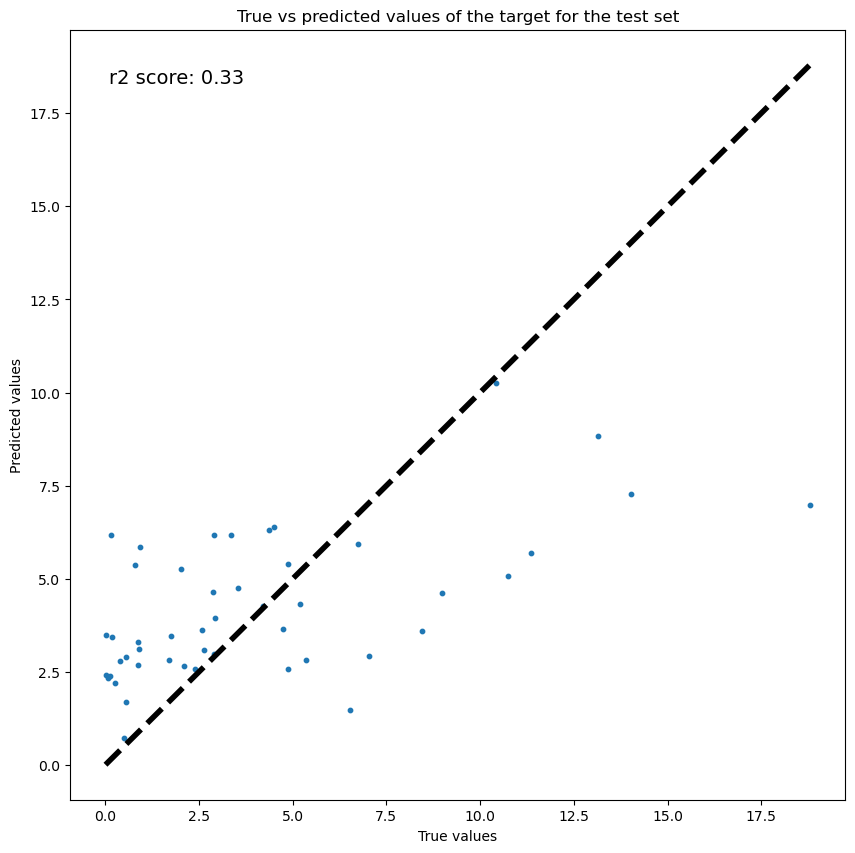

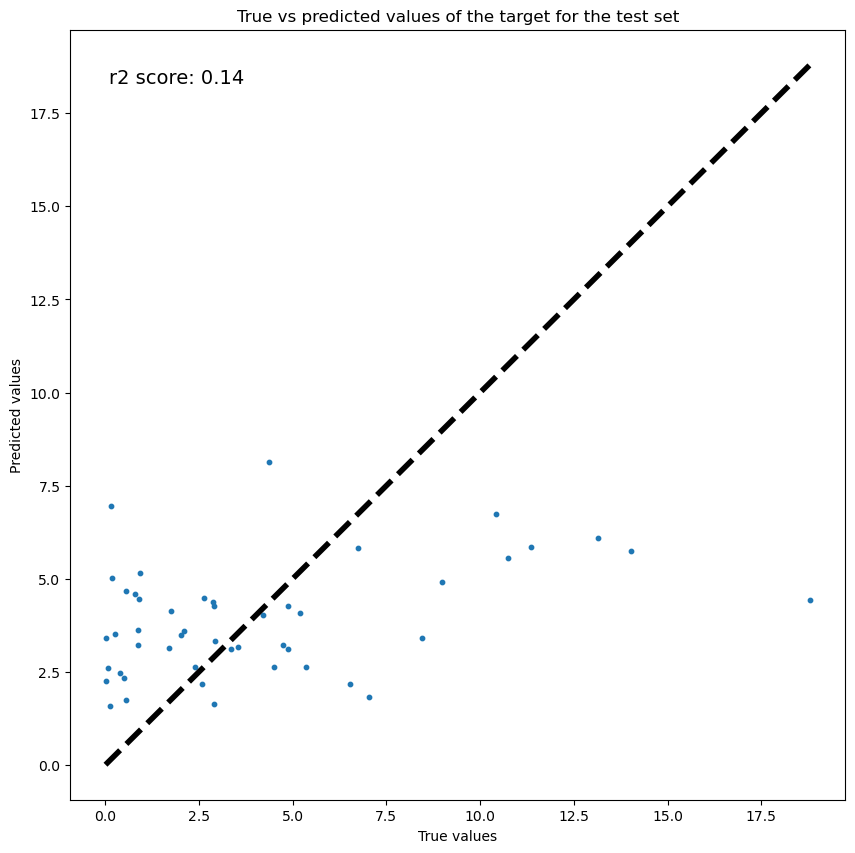

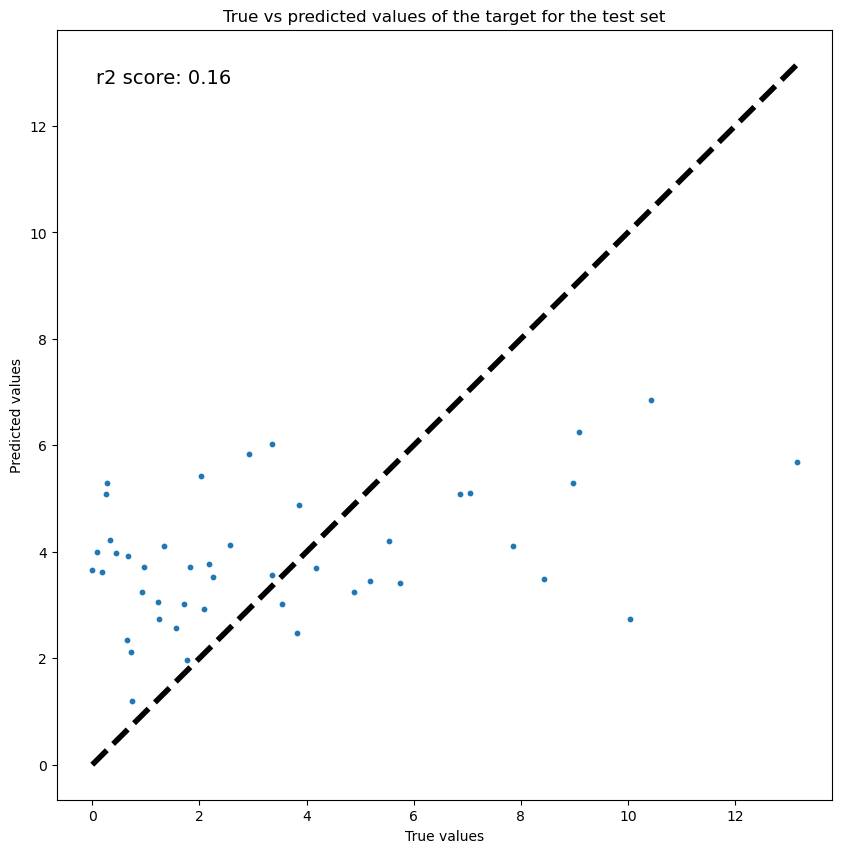

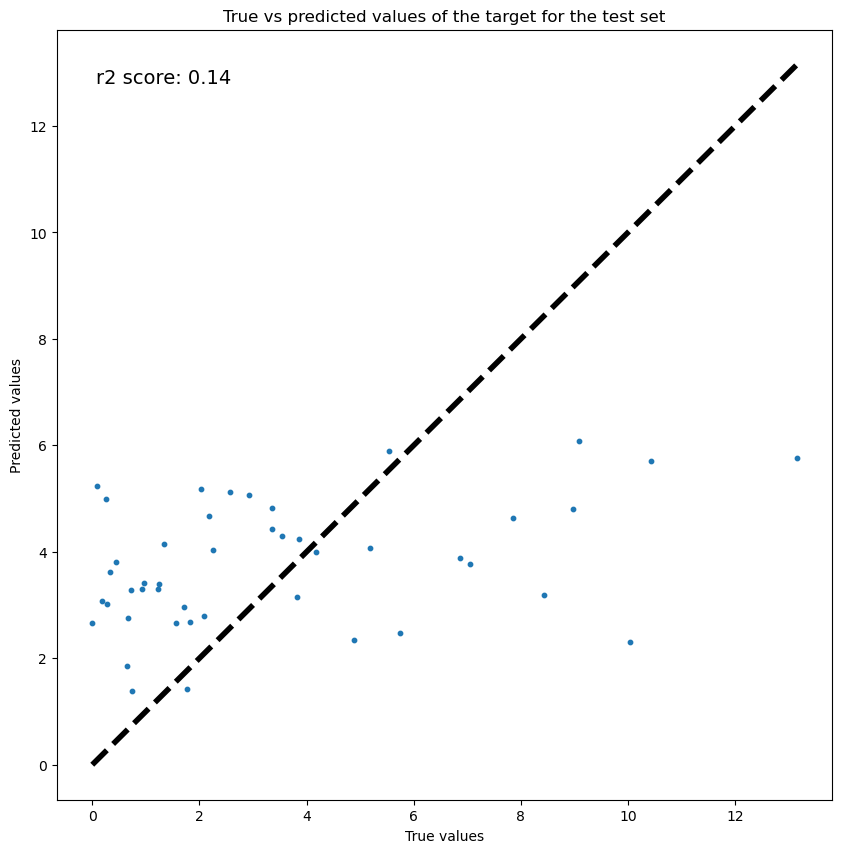

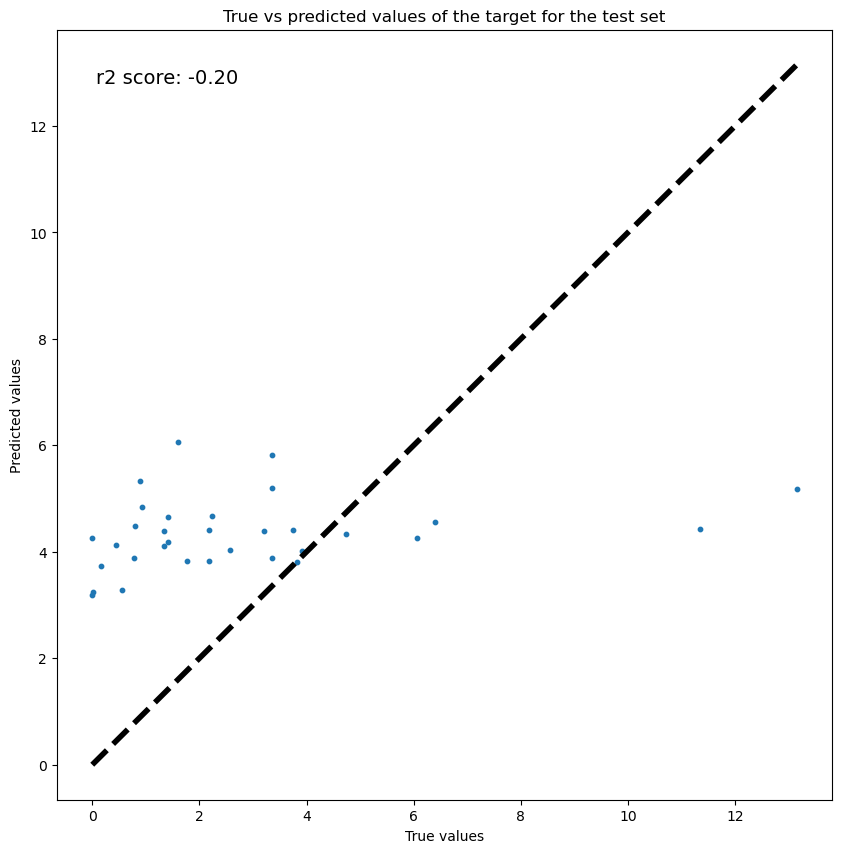

...

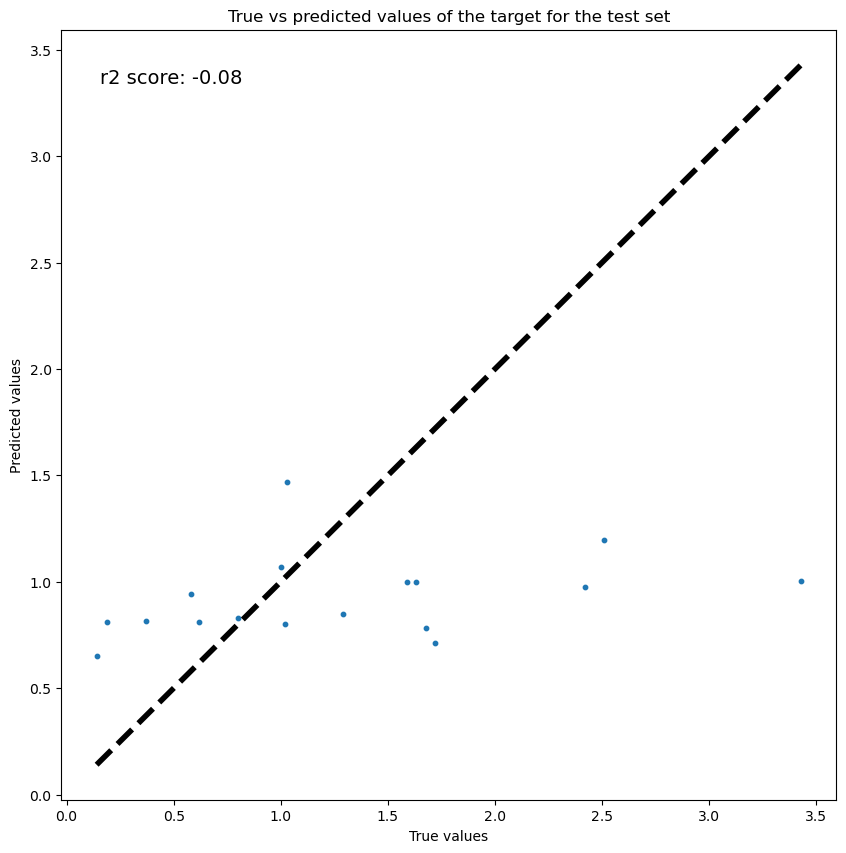

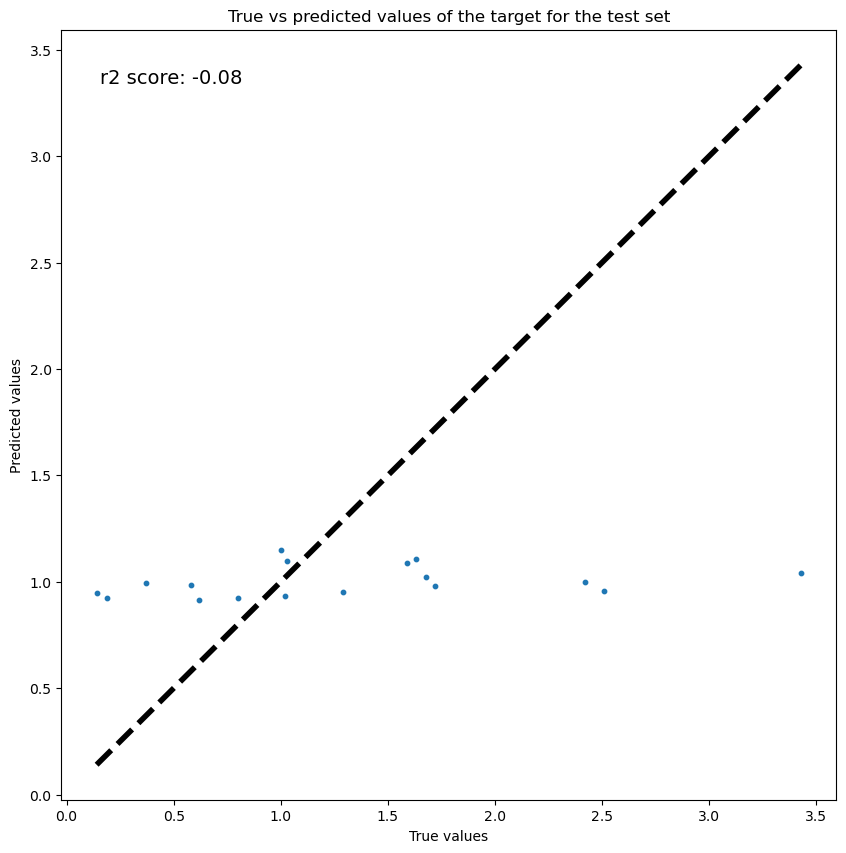

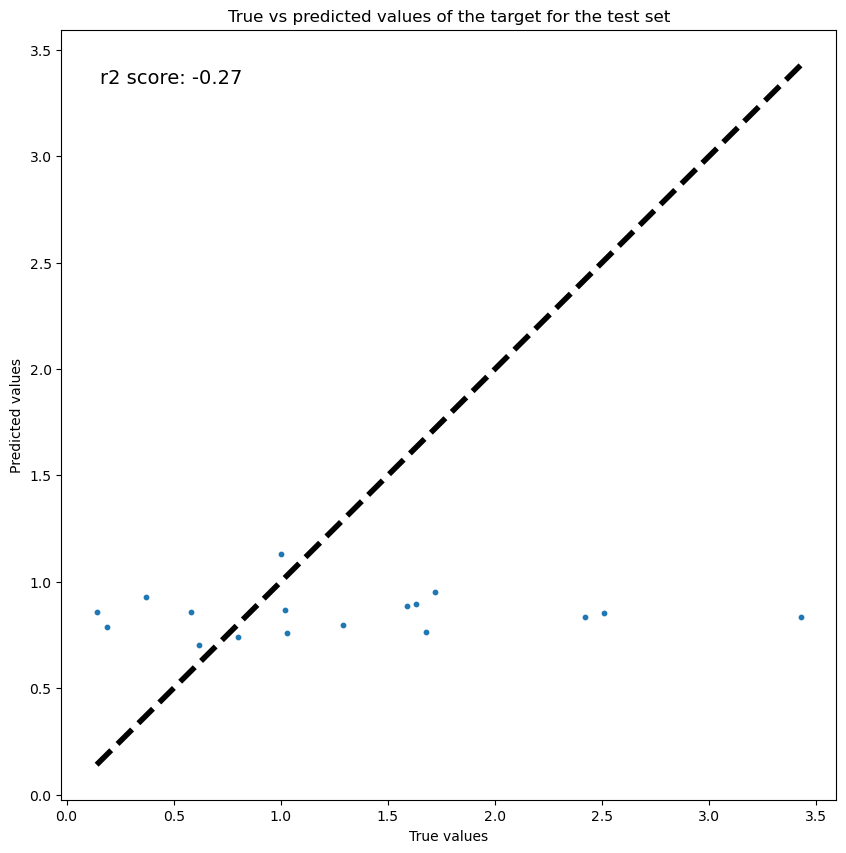

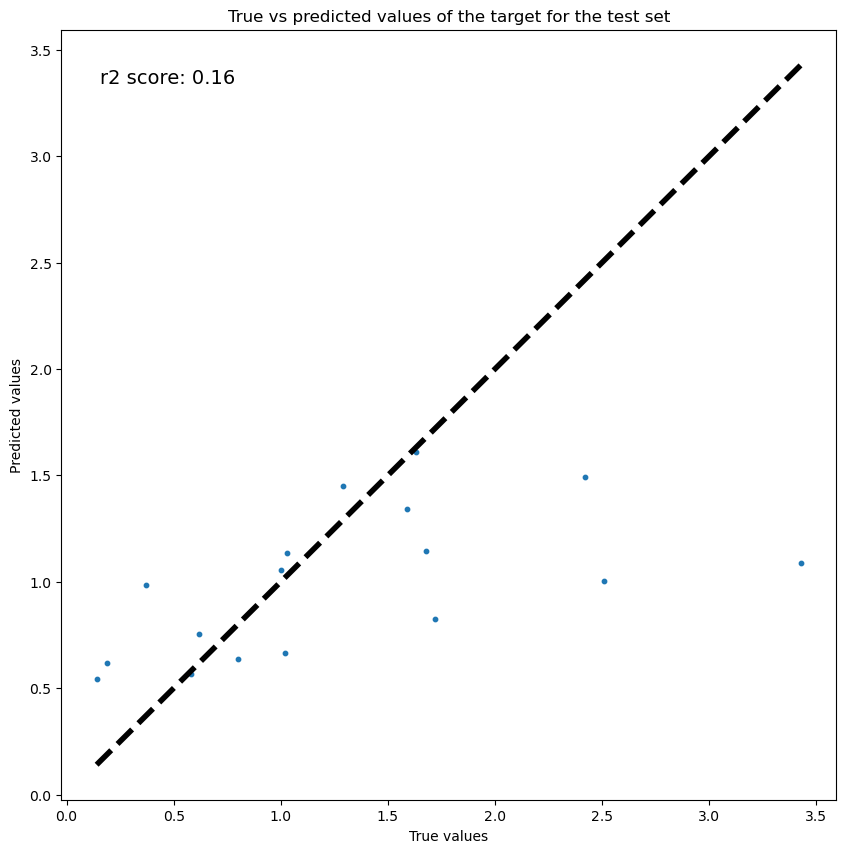

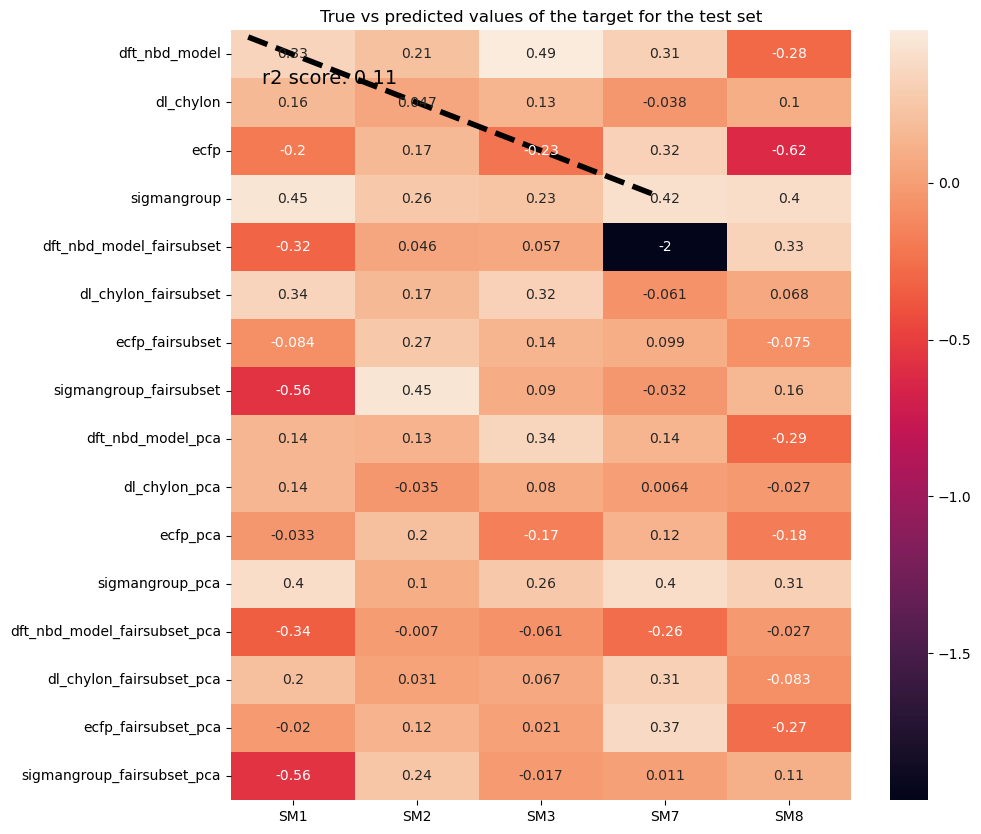

In [17]:
import pandas as pd
import numpy as np
from obelix_ml_pipeline.representation_variables import AVAILABLE_LIGAND_REPRESENTATION_TYPES, AVAILABLE_SUBSTRATE_REPRESENTATION_TYPES
import seaborn as sns

target = 'DDG'
target_threshold = 0.6
scoring = 'r2'
train_splits = 5
n_jobs = 4
binary = False
plot_dendrograms = False
substrate_names_column = 'Substrate'
ligand_numbers_column = 'Ligand#'

training_size = 0.75

print_ml_results = True

# loop over all substrate/ligand representations
# collect mean and std of test performance during training per representation for plotting
list_of_test_scores_mean = []
list_of_test_scores_std = []
test_performance = []
res_df = pd.DataFrame(np.zeros((len(AVAILABLE_LIGAND_REPRESENTATION_TYPES)*2,len(['SM1','SM2','SM3','SM7','SM8']))), 
                 index = AVAILABLE_LIGAND_REPRESENTATION_TYPES+[i+'_pca' for i in AVAILABLE_LIGAND_REPRESENTATION_TYPES],
                columns = ['SM1','SM2','SM3','SM7','SM8'])

for selected_substrate in ['SM1','SM2','SM3','SM7','SM8']:
    print('\n')
    print(selected_substrate)
    
    list_of_test_scores_mean_l = []
    list_of_test_scores_std_l = []
    test_performance_l = []
    
    for selected_ligand_representations in AVAILABLE_LIGAND_REPRESENTATION_TYPES:

        print(f'{selected_ligand_representations}')

        rf_model = RandomForestRegressor(random_state = 42)
        list_of_test_scores_mean_ls = []
        list_of_test_scores_std_ls = []
        test_performance_ls = []
        res = predict_within_substrate_class(
            [selected_ligand_representations],
            ligand_numbers_column, substrate_names_column, target, target_threshold, train_splits, binary,
            selected_substrate, training_size, rf_model, scoring, print_ml_results, n_jobs)


        res_df.loc[selected_ligand_representations,selected_substrate]=res.testing_performance_test
        
        list_of_test_scores_mean_l.append(res.training_test_scores_mean)
        list_of_test_scores_std_l.append(res.training_test_scores_std)
        test_performance_l.append(res.testing_performance_test)
        
        res = predict_within_substrate_class(
            [selected_ligand_representations],
            ligand_numbers_column, substrate_names_column, target, target_threshold, train_splits, binary,
            selected_substrate, training_size, rf_model, scoring, print_ml_results, n_jobs,
            reduce_train_test_data_dimensionality=True, transformer=PCA(n_components=0.95))


        res_df.loc[selected_ligand_representations+'_pca',selected_substrate]=res.testing_performance_test
        
        list_of_test_scores_mean_l.append(res.training_test_scores_mean)
        list_of_test_scores_std_l.append(res.training_test_scores_std)
        test_performance_l.append(res.testing_performance_test)
    
    sns.heatmap(res_df, annot=True)

    list_of_test_scores_mean.append(list_of_test_scores_mean_l)
    list_of_test_scores_std.append(list_of_test_scores_std_l)
    test_performance.append(test_performance_l)

<Axes: >

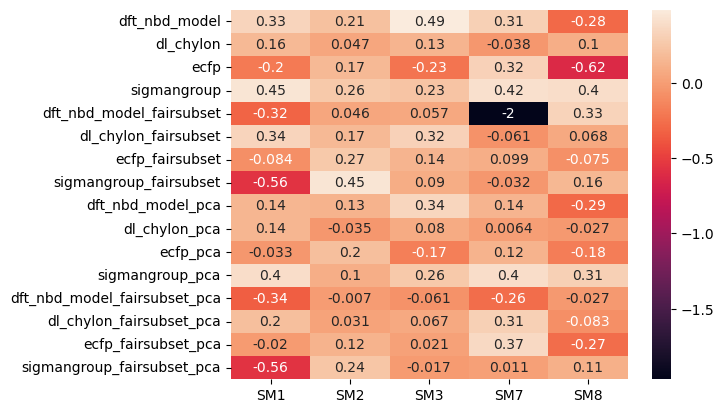

In [18]:
sns.heatmap(res_df, annot=True)



SM1
dft_nbd_model
Mean test performance: 0.50 +/- 0.19
Best model performance: 0.88
Best model parameters: {'bootstrap': False, 'max_depth': 5, 'max_features': 5, 'min_samples_leaf': 2, 'min_samples_split': 5, 'n_estimators': 50}
Test set performance r2:  0.6337151763159443
Mean test performance: 0.40 +/- 0.13
Best model performance: 0.89
Best model parameters: {'bootstrap': False, 'max_depth': 5, 'max_features': 5, 'min_samples_leaf': 2, 'min_samples_split': 5, 'n_estimators': 100}
Test set performance r2:  0.545195281101754
dl_chylon
Mean test performance: 0.34 +/- 0.07
Best model performance: 0.99
Best model parameters: {'bootstrap': False, 'max_depth': 50, 'max_features': 5, 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 50}
Test set performance r2:  -0.03169692576560679
Mean test performance: 0.27 +/- 0.06
Best model performance: 0.99
Best model parameters: {'bootstrap': False, 'max_depth': 50, 'max_features': 5, 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_

/projects/home/cvalsecc/repo/obelix-ml-pipeline/obelix_ml_pipeline/notebooks/../../obelix_ml_pipeline/machine_learning.py:116: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.



Mean test performance: 0.13 +/- 0.16
Best model performance: 0.82
Best model parameters: {'bootstrap': False, 'max_depth': 5, 'max_features': 5, 'min_samples_leaf': 1, 'min_samples_split': 10, 'n_estimators': 100}
Test set performance r2:  -0.18620878596092294
sigmangroup
Mean test performance: 0.02 +/- 0.04
Best model performance: 0.67
Best model parameters: {'bootstrap': False, 'max_depth': 5, 'max_features': 5, 'min_samples_leaf': 2, 'min_samples_split': 10, 'n_estimators': 100}
Test set performance r2:  -1.093260517642165
Mean test performance: -0.04 +/- 0.05
Best model performance: 0.62
Best model parameters: {'bootstrap': False, 'max_depth': 5, 'max_features': 3, 'min_samples_leaf': 2, 'min_samples_split': 10, 'n_estimators': 100}
Test set performance r2:  -0.6755733395509764
dft_nbd_model_fairsubset
Mean test performance: -23.25 +/- 46.50
Best model performance: 0.43
Best model parameters: {'bootstrap': False, 'max_depth': 5, 'max_features': 5, 'min_samples_leaf': 2, 'min_sample

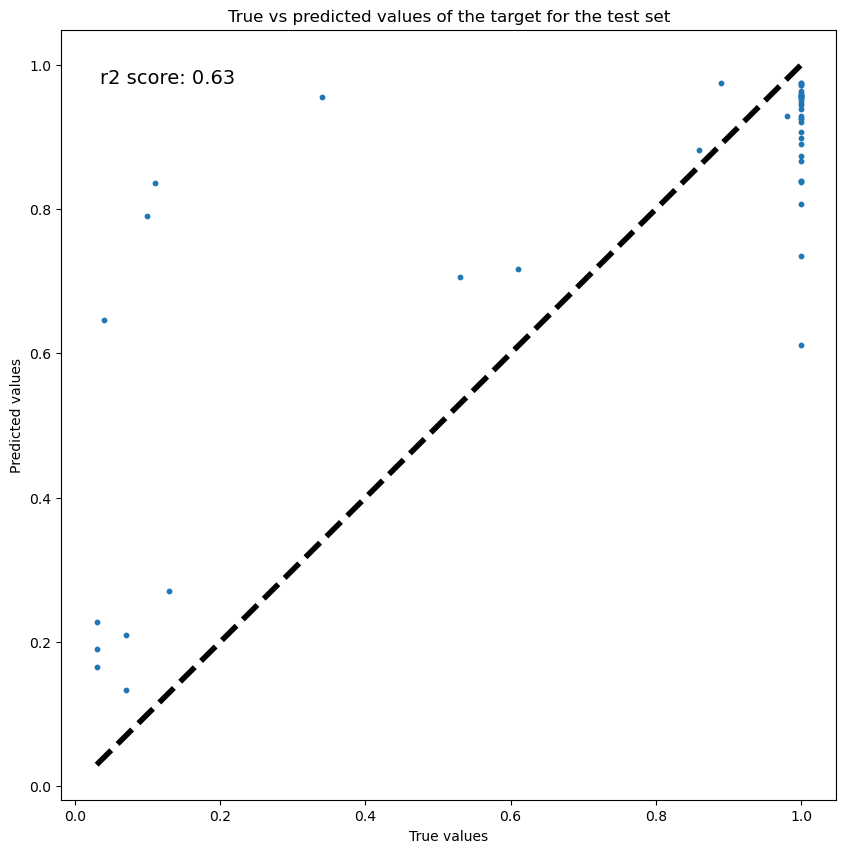

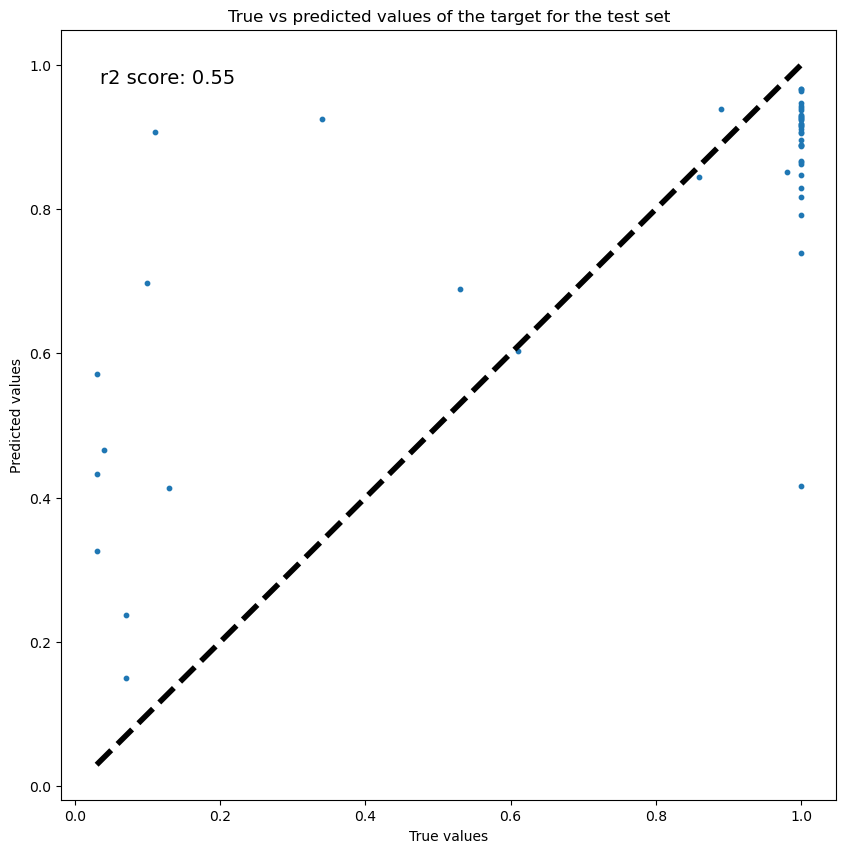

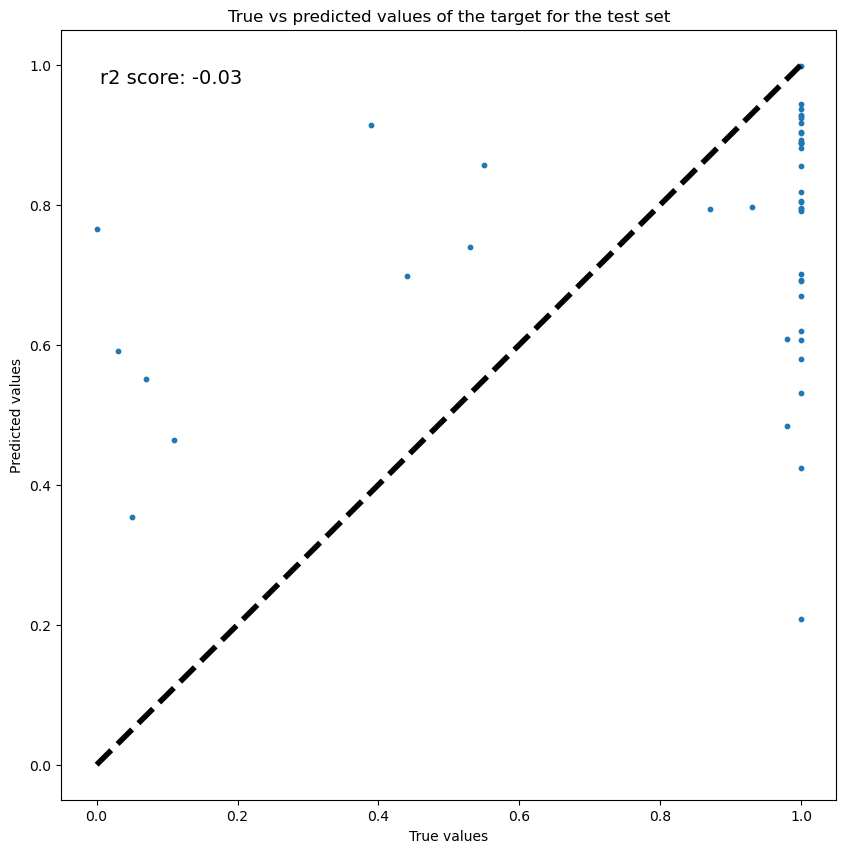

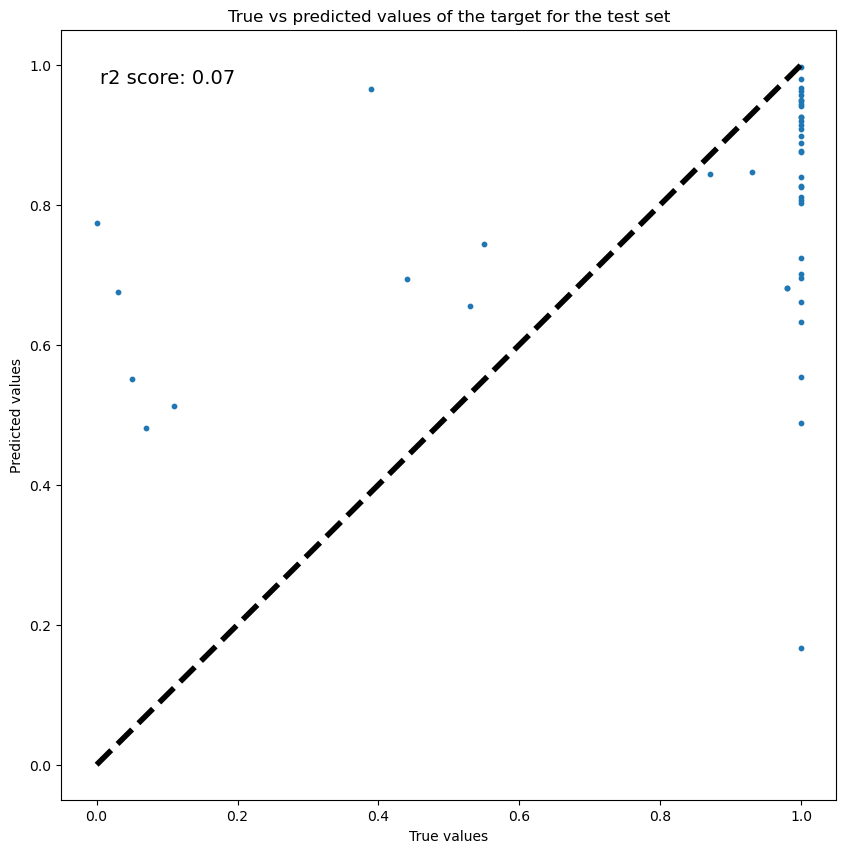

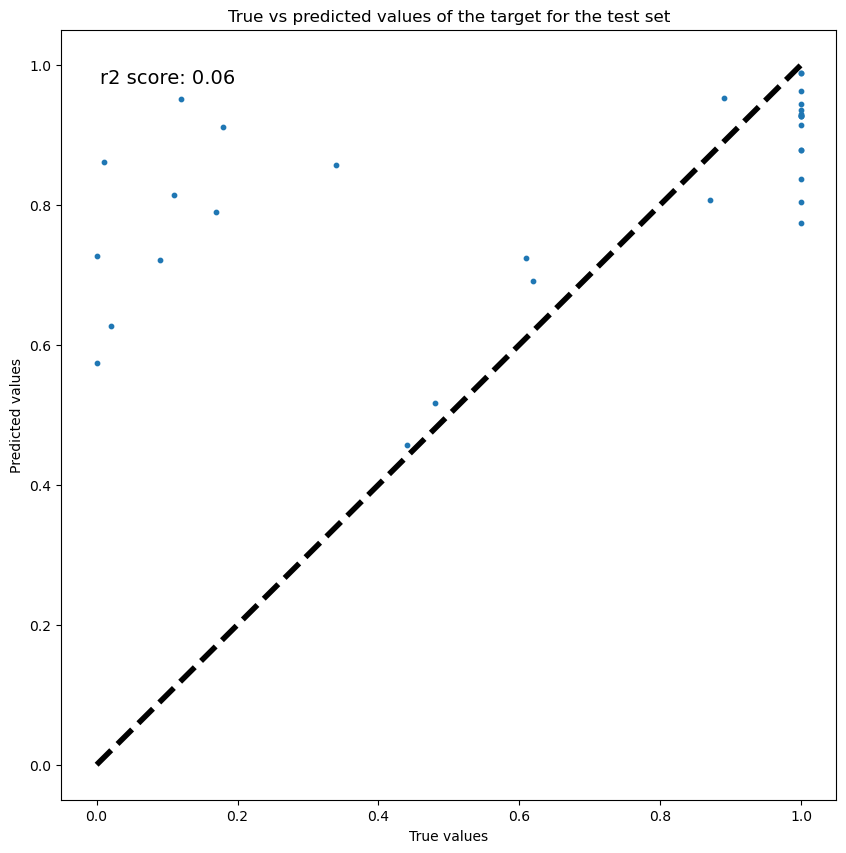

...

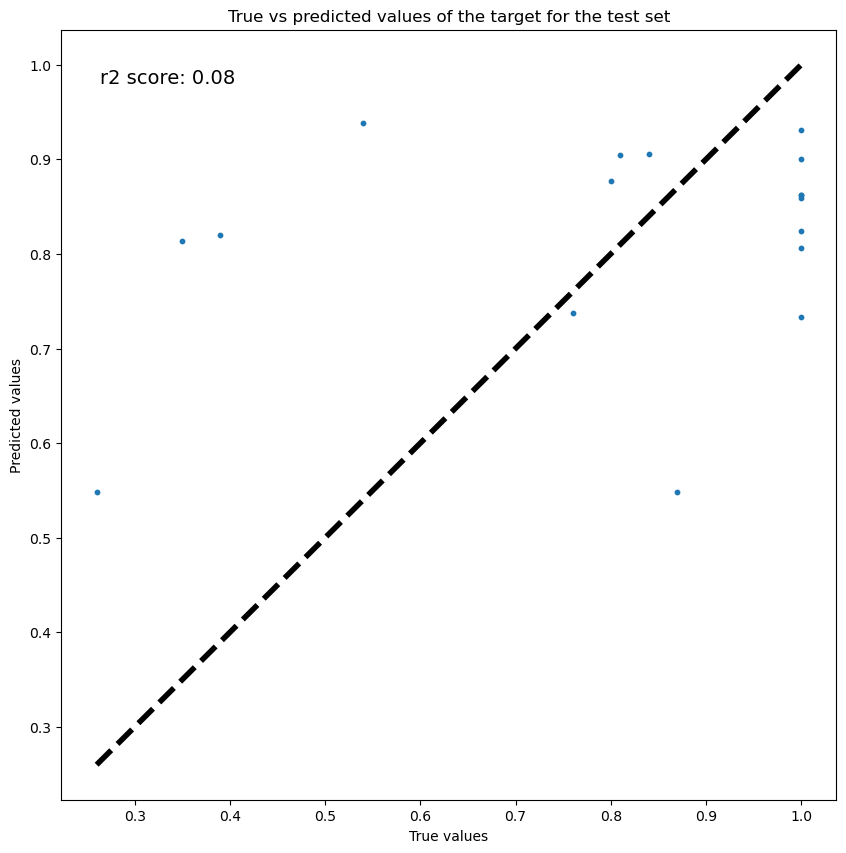

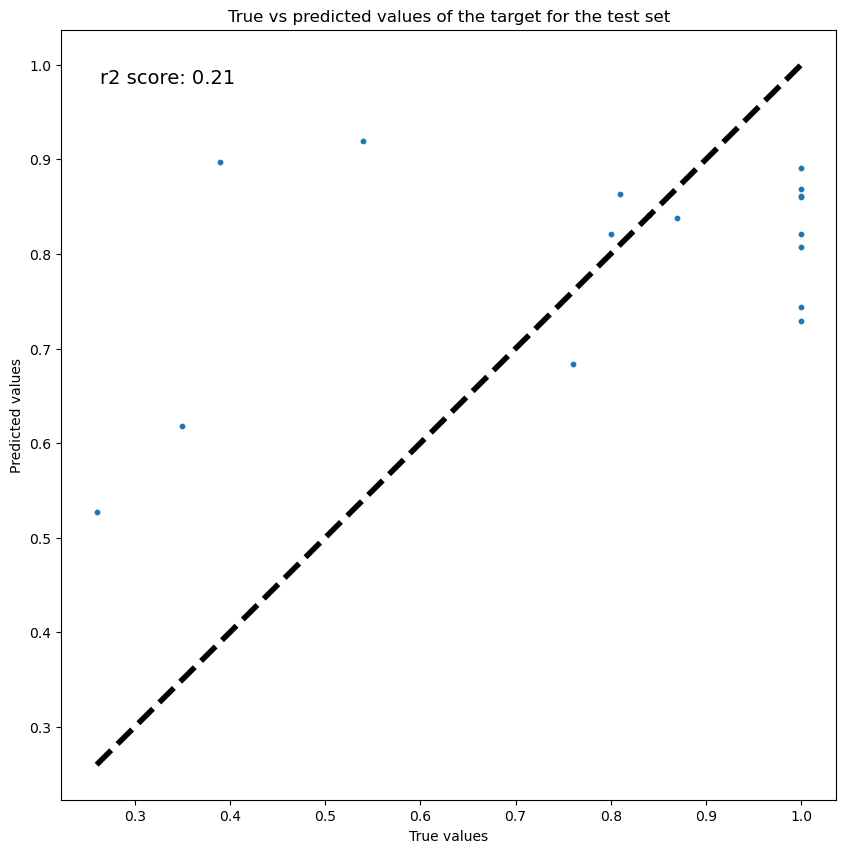

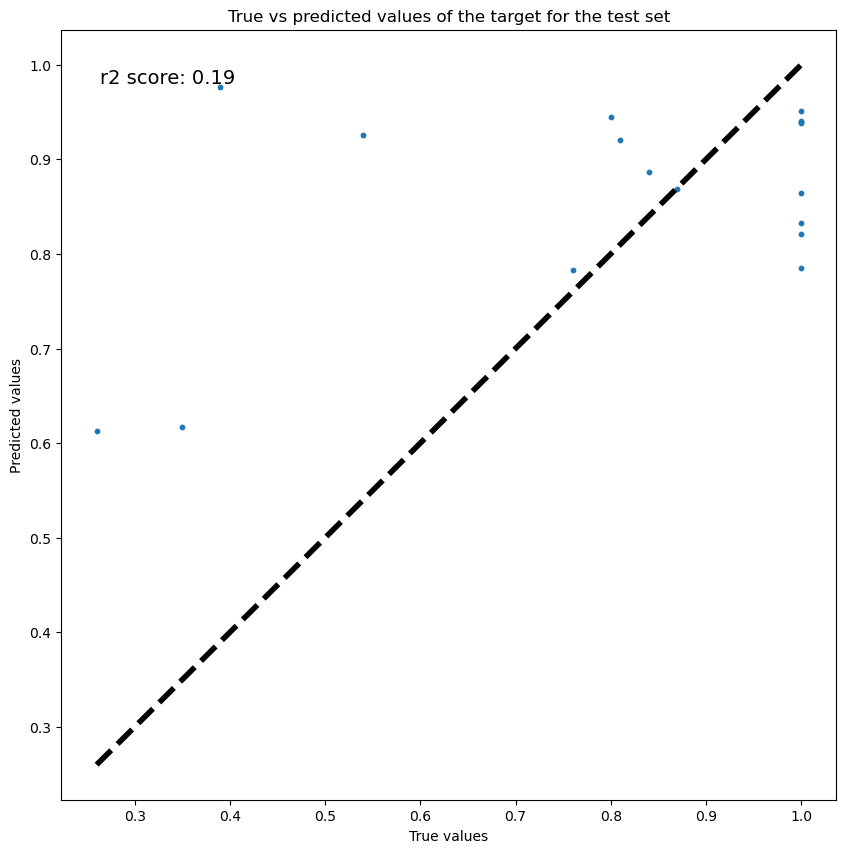

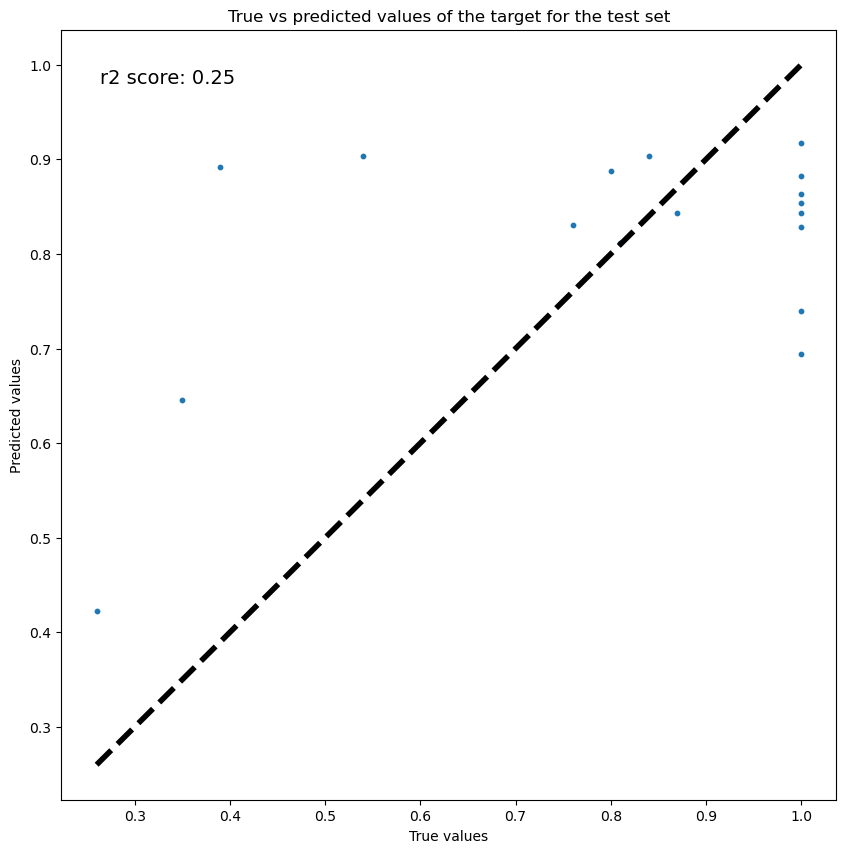

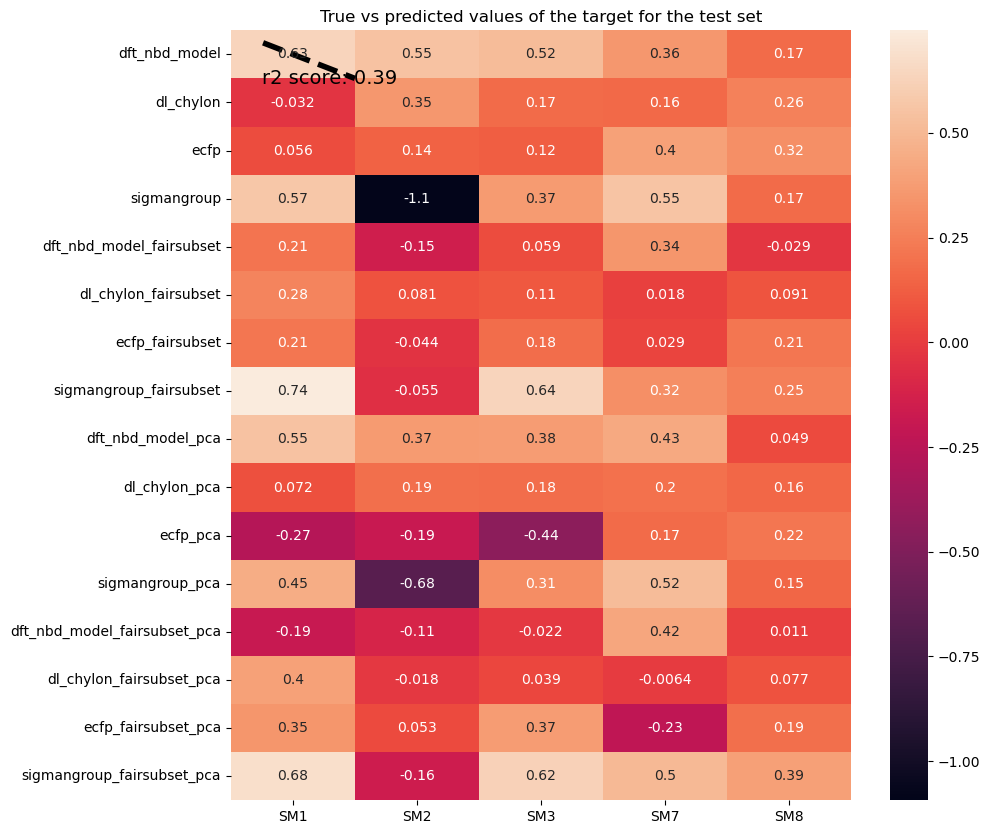

In [40]:
import pandas as pd
import numpy as np
from obelix_ml_pipeline.representation_variables import AVAILABLE_LIGAND_REPRESENTATION_TYPES, AVAILABLE_SUBSTRATE_REPRESENTATION_TYPES
import seaborn as sns

target = 'Conversion'
target_threshold = 0.6
scoring = 'r2'
train_splits = 5
n_jobs = 4
binary = False
plot_dendrograms = False
substrate_names_column = 'Substrate'
ligand_numbers_column = 'Ligand#'

training_size = 0.75

print_ml_results = True

# loop over all substrate/ligand representations
# collect mean and std of test performance during training per representation for plotting
list_of_test_scores_mean = []
list_of_test_scores_std = []
test_performance = []
res_df = pd.DataFrame(np.zeros((len(AVAILABLE_LIGAND_REPRESENTATION_TYPES)*2,len(['SM1','SM2','SM3','SM7','SM8']))), 
                 index = AVAILABLE_LIGAND_REPRESENTATION_TYPES+[i+'_pca' for i in AVAILABLE_LIGAND_REPRESENTATION_TYPES],
                columns = ['SM1','SM2','SM3','SM7','SM8'])

for selected_substrate in ['SM1','SM2','SM3','SM7','SM8']:
    print('\n')
    print(selected_substrate)
    
    list_of_test_scores_mean_l = []
    list_of_test_scores_std_l = []
    test_performance_l = []
    
    for selected_ligand_representations in AVAILABLE_LIGAND_REPRESENTATION_TYPES:

        print(f'{selected_ligand_representations}')

        rf_model = RandomForestRegressor(random_state = 42)
        list_of_test_scores_mean_ls = []
        list_of_test_scores_std_ls = []
        test_performance_ls = []
        res = predict_within_substrate_class(
            [selected_ligand_representations],
            ligand_numbers_column, substrate_names_column, target, target_threshold, train_splits, binary,
            selected_substrate, training_size, rf_model, scoring, print_ml_results, n_jobs)


        res_df.loc[selected_ligand_representations,selected_substrate]=res.testing_performance_test
        
        list_of_test_scores_mean_l.append(res.training_test_scores_mean)
        list_of_test_scores_std_l.append(res.training_test_scores_std)
        test_performance_l.append(res.testing_performance_test)
        
        res = predict_within_substrate_class(
            [selected_ligand_representations],
            ligand_numbers_column, substrate_names_column, target, target_threshold, train_splits, binary,
            selected_substrate, training_size, rf_model, scoring, print_ml_results, n_jobs,
            reduce_train_test_data_dimensionality=True, transformer=PCA(n_components=0.95))


        res_df.loc[selected_ligand_representations+'_pca',selected_substrate]=res.testing_performance_test
        
        list_of_test_scores_mean_l.append(res.training_test_scores_mean)
        list_of_test_scores_std_l.append(res.training_test_scores_std)
        test_performance_l.append(res.testing_performance_test)
    
    sns.heatmap(res_df, annot=True)

    list_of_test_scores_mean.append(list_of_test_scores_mean_l)
    list_of_test_scores_std.append(list_of_test_scores_std_l)
    test_performance.append(test_performance_l)

<Axes: >

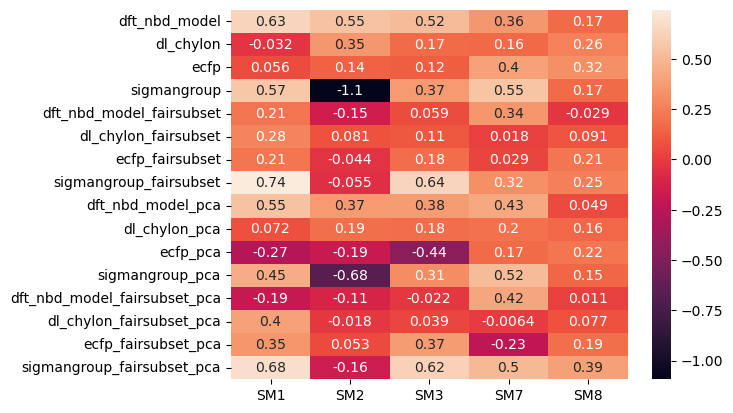

In [41]:
sns.heatmap(res_df, annot=True)